## 1. Import Library

In [4]:
from fastai.vision.all import *

## 2. Data

In [5]:
untar_data('https://s3.amazonaws.com/fast-ai-imageclas/oxford-iiit-pet.tgz')

Path('/root/.fastai/data/oxford-iiit-pet')

> `fastai`의 인스턴스. `tar.gz`, `tgz`파일을 가져오고, 압축을 해제한다.

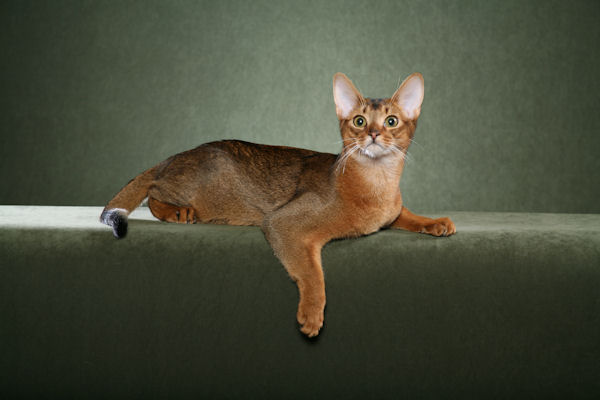

In [6]:
PILImage.create("/root/.fastai/data/oxford-iiit-pet/images/Abyssinian_1.jpg")  ## Python Image Library

In [7]:
img_paths = get_image_files("/root/.fastai/data/oxford-iiit-pet/images")  ## 디렉토리에 있는 모든 이미지 파일들의 디렉토리를 가져온다.
img_paths[0]

Path('/root/.fastai/data/oxford-iiit-pet/images/Sphynx_14.jpg')

### 자료에 대한 진실...

---


> 사실 고양이는 파일명의 첫 글자가 대문자로, 강아지는 소문자로 되어있다...!

In [8]:
def label_sep(fname) :
    if fname[0].isupper() :
        return "cat"
    else :
        return "dog"

`-` 컴퓨터가 잘 이해할 수 있도록 하는 정보 묶음을 만들어보자(자, 이건 고양이고, 이건 강아지야.)

In [9]:
dls = ImageDataLoaders.from_name_func(
    path = '/root/.fastai/data/oxford-iiit-pet/images',
    fnames = img_paths,
    label_func = label_sep,
    item_tfms = Resize(224)  ## 이미지의 크기를 강제로 224*224로 변경
)

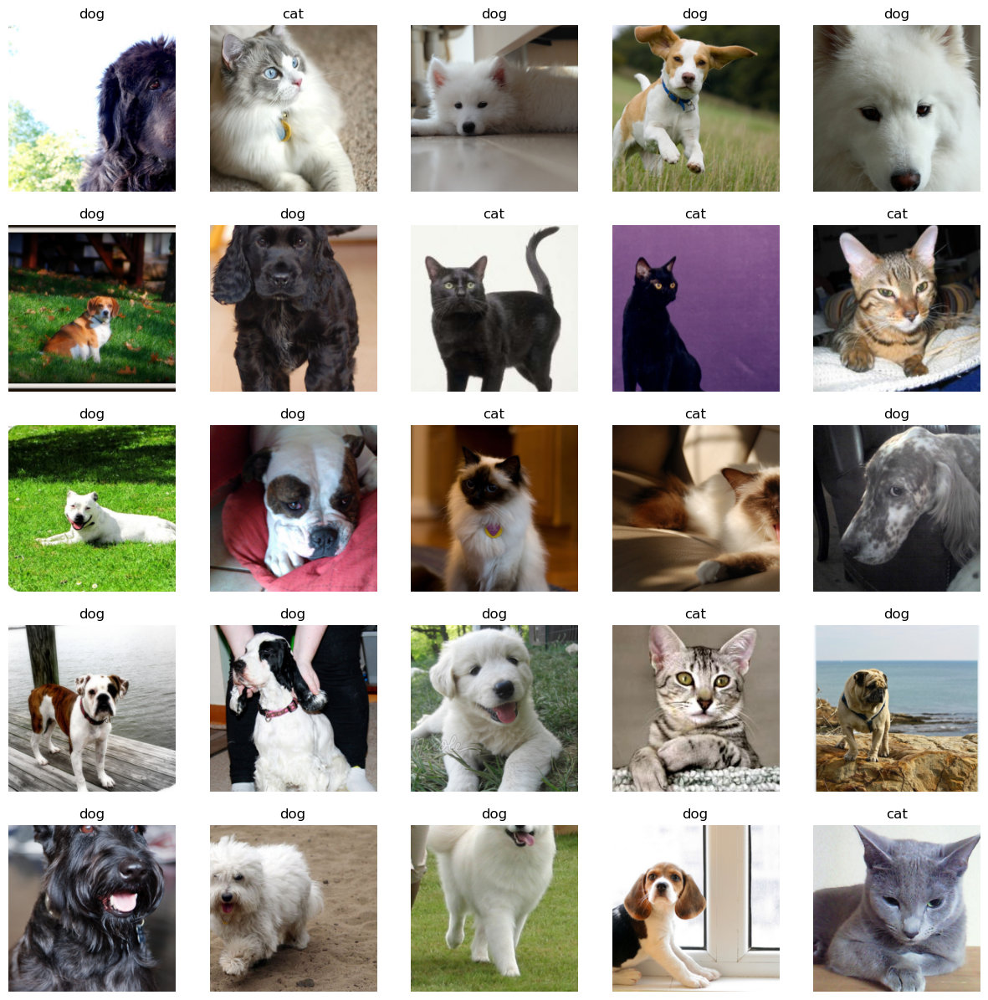

In [10]:
dls.show_batch(max_n = 25)

> dls에 정보가 잘 저장되어 있음을 확인할 수 있다.

## 3. Tuning

`-` 학습자 lrnr 생성

In [11]:
lrnr = vision_learner(
    dls = dls,
    arch = resnet34,
    metrics = accuracy
)

In [12]:
lrnr.fine_tune(1)  ## 1회 파인튜닝

epoch,train_loss,valid_loss,accuracy,time
0,0.138800,0.025903,0.991204,03:08


epoch,train_loss,valid_loss,accuracy,time
0,0.046629,0.023826,0.992558,04:56


> 정확도가 아주 높다...!

`-` 기존 자료의 예측

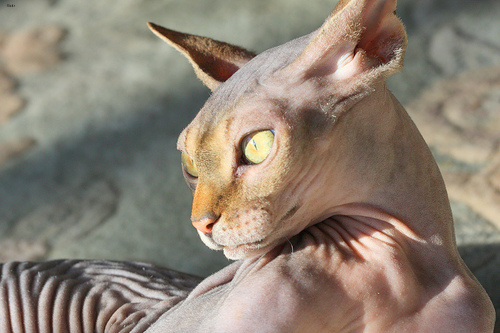

In [13]:
img0 = PILImage.create(img_paths[0])
img0  ## 고양이

In [14]:
lrnr.predict(img0)

('cat', tensor(0), tensor([1.0000e+00, 1.0262e-09]))

> 99.995%의 확률로 "이건 고양이야"라고 예측하고 있다.

`-` 그럼 틀리는 게 있긴 한가??

> 취약점 분석 모듈 : Interpretation

In [15]:
Inter = Interpretation.from_learner(lrnr)

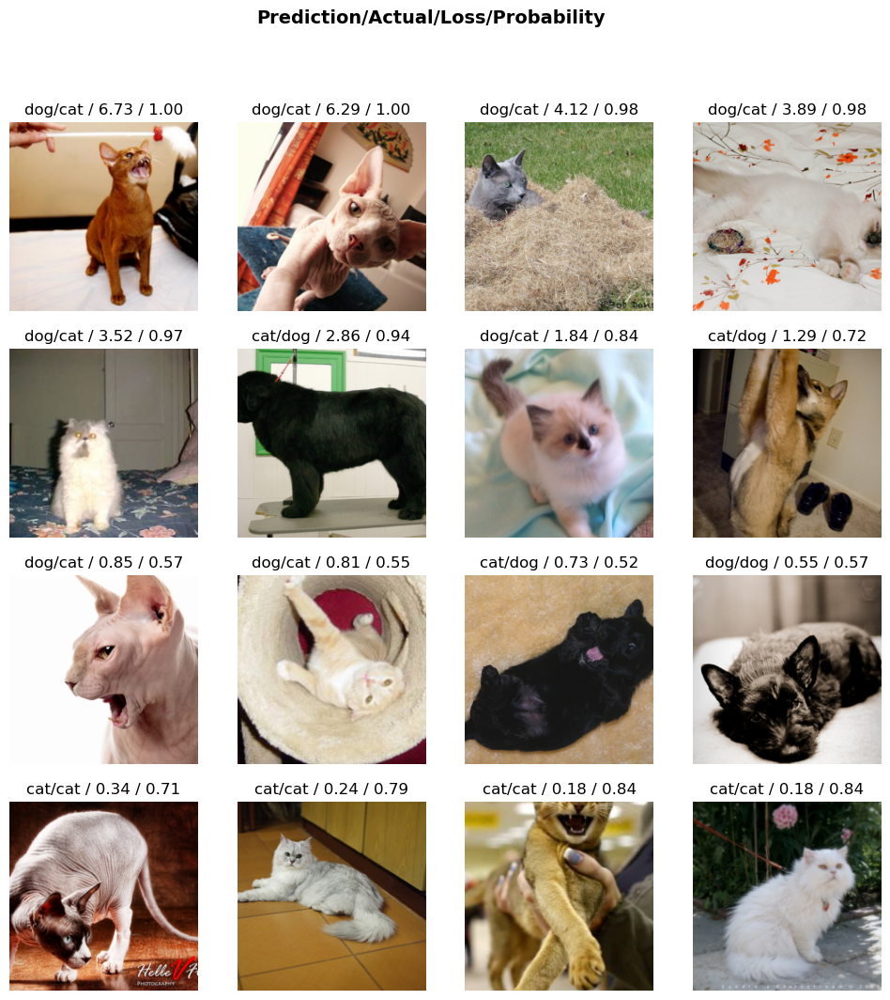

In [16]:
Inter.plot_top_losses(16)

> 맨 첫번째 그림은 Loss가 제일 높다. 왜냐면 거의 100% 고양이라고 예측했는데 강아지였기 때문. 따라서 패널티를 높게 받았다.

`-` 진짜 잘 되는 게 맞는지 다른 사진을 가져와보자.


In [17]:
import requests

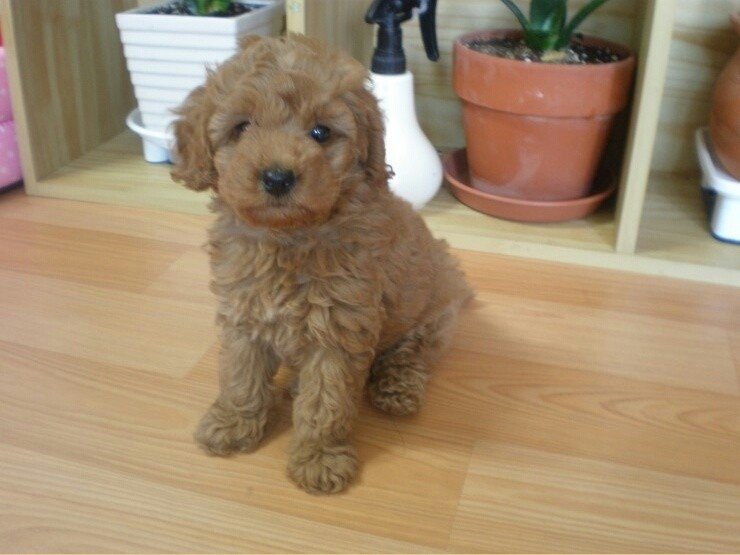

In [18]:
OnYu = PILImage.create(requests.get("https://github.com/HollyRiver/DL2024/blob/main/Data/OnYu.jpg?raw=true").content)
OnYu

In [19]:
lrnr.predict(OnYu)

('dog', tensor(1), tensor([2.2950e-05, 9.9998e-01]))

## 4. 크롤링

`-` 웹에서 데이터를 크롤링하여 간단한 인공지능을 만들어보자.

In [20]:
from duckduckgo_search import DDGS

In [21]:
def search_images(keyword, max_images=200):
    with DDGS() as ddgs:
        ddgs_images_gen = ddgs.images(
          keyword,
          max_results=max_images,
        )
        results = [r for r in ddgs_images_gen]
    image_sources = [r['image'] for r in results]
    return image_sources

In [22]:
!mkdir images
!mkdir images/train
!mkdir images/train/iu
!mkdir images/train/hynn

`-` 이미지를 다운로드

In [23]:
download_images(dest='./images/train/hynn',urls=search_images('HYNN',max_images=200))
download_images(dest='./images/train/iu',urls=search_images('IU',max_images=200))

`-` 불량 이미지 목록 확보

In [24]:
bad_images = verify_images(get_image_files('./images'))
bad_images

(#10) [Path('images/train/iu/6f8fdd06-fe57-4a1e-ab33-85263156a550.jpg'),Path('images/train/iu/b64d4a6c-3350-40e8-90f9-3892c72b8929.jpg'),Path('images/train/iu/32c01db6-0855-40cb-ab27-21c6b40c4435.jpg'),Path('images/train/iu/6044d56c-a3e1-4e5e-ac68-e90229981b2b.jpg'),Path('images/train/iu/e30ab77e-0ee8-4d57-bf66-57dbd34c4e6b.jpg'),Path('images/train/iu/33ab5223-5075-4d22-9798-fdbf57950985.jpg'),Path('images/train/hynn/0ed4793e-5315-4d3c-bc58-b6f97a30da6c.jpeg'),Path('images/train/hynn/c720c49f-5fea-461f-b2de-7f307074434c.jpg'),Path('images/train/hynn/824ebb5d-88e5-46e5-9af1-ec525ee34b89.jpg'),Path('images/train/hynn/bd8e0534-ed33-49de-a365-e311773c954c.jpg')]

`-` 불량이미지를 학습에 제거

In [25]:
 bad_images.map(Path.unlink)

(#10) [None,None,None,None,None,None,None,None,None,None]

### **A. 데이터 준비(DLS)**

In [26]:
dls = ImageDataLoaders.from_folder(
    path = "./images",  ## data files directory
    train = "train",    ## train dataset directory
    valid_pct = 0.2,
    item_tfms = Resize(224)
)

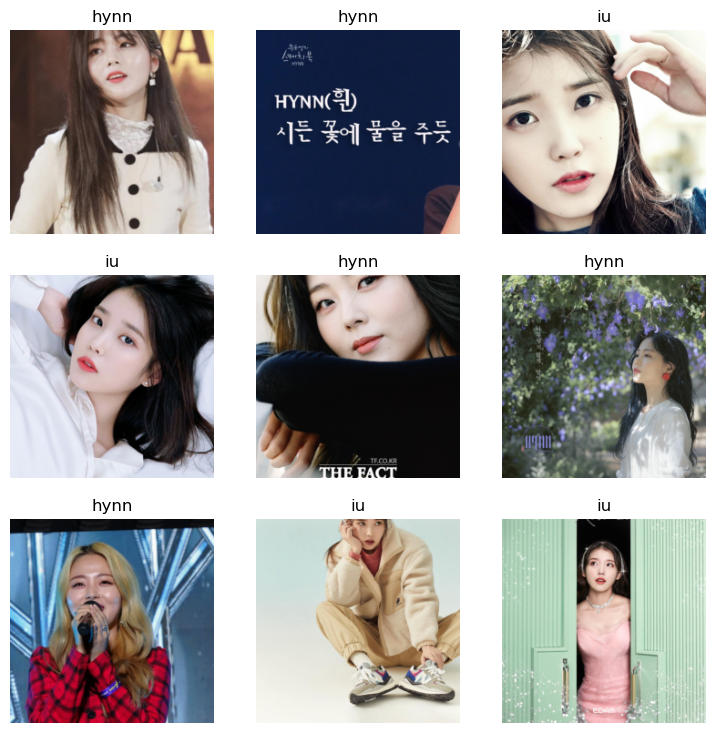

In [27]:
dls.show_batch()

### **B. 러너 생성**

In [28]:
lrnr = vision_learner(
    dls = dls,
    arch = resnet34,
    metrics = accuracy
)

### **C. 학습**

In [29]:
lrnr.fine_tune(7)

epoch,train_loss,valid_loss,accuracy,time
0,1.265473,0.928552,0.538462,00:17


epoch,train_loss,valid_loss,accuracy,time
0,0.751572,0.746316,0.661538,00:22
1,0.579267,0.668413,0.753846,00:22
2,0.438334,0.618515,0.784615,00:23
3,0.339269,0.553571,0.784615,00:23
4,0.266673,0.560098,0.815385,00:22
5,0.223757,0.548885,0.830769,00:24
6,0.186179,0.534121,0.830769,00:24


### **D. 예측**

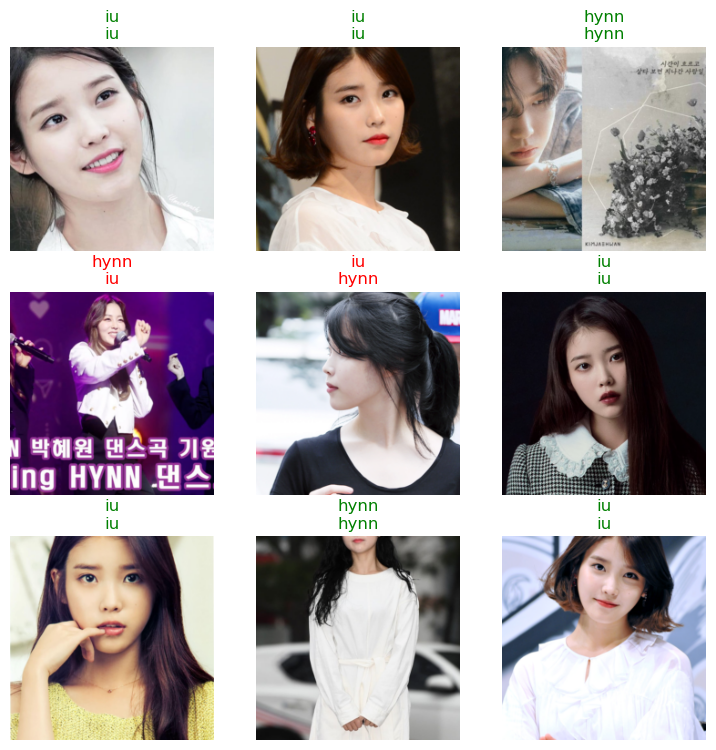

In [30]:
lrnr.show_results()

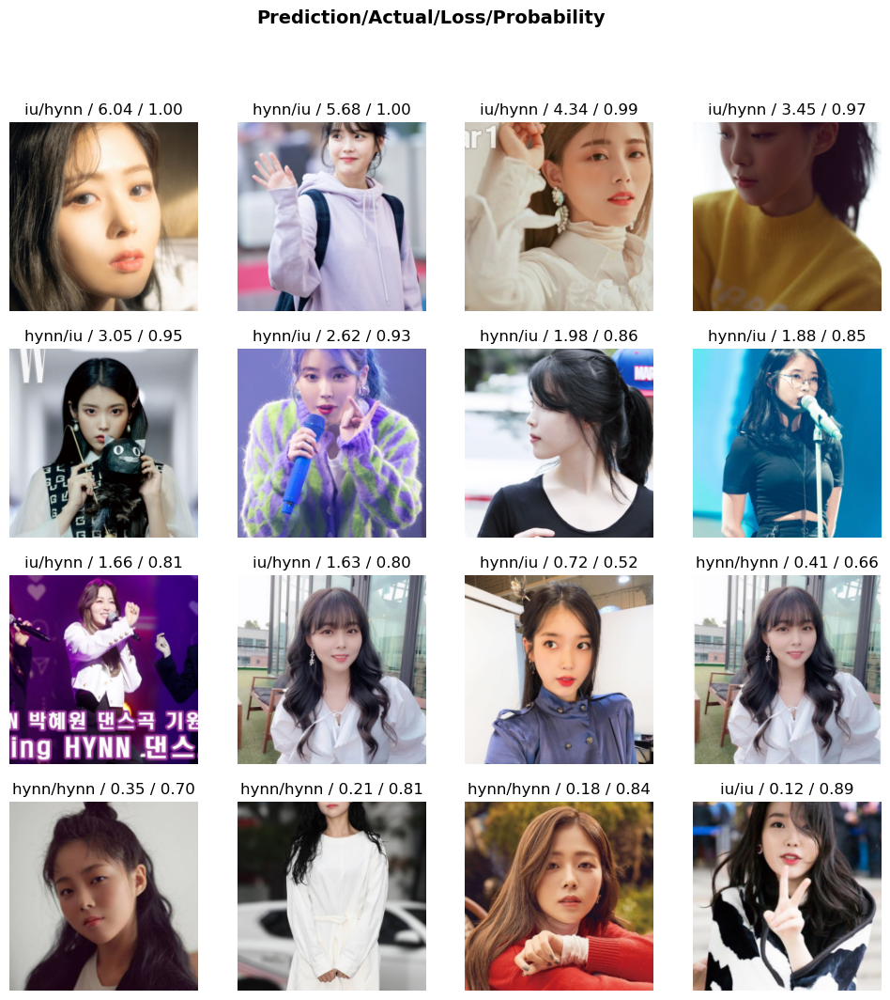

In [31]:
inter = Interpretation.from_learner(lrnr)
inter.plot_top_losses(16)

> 손실이 가장 큰 16개의 데이터를 보여준다.

In [32]:
!rm -rf images
!mkdir images
!mkdir images/train
!mkdir images/train/mun
!mkdir images/train/hong

In [33]:
download_images(dest='./images/train/mun',urls=search_images('문재인',max_images=200))
download_images(dest='./images/train/hong',urls=search_images('홍준표',max_images=200))

In [34]:
bad_images = verify_images(get_image_files('./images'))
bad_images

(#5) [Path('images/train/hong/136cca23-40a6-4b62-975d-e483cd214576.jpg'),Path('images/train/hong/450666d4-d625-4f29-92ae-500a11a944a8.jpg'),Path('images/train/mun/7cbe7b84-083a-439c-87c2-23eb512acf1b.jpg'),Path('images/train/mun/d64ad3b6-fa22-4976-a3f8-19a7c15ddc6d.jpg'),Path('images/train/mun/10a64dde-727d-4e54-a8c6-6767e2f05c0d.png')]

In [35]:
bad_images.map(Path.unlink)

(#5) [None,None,None,None,None]

epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time
0,0.636174,0.440799,0.814286,00:22
1,0.477810,0.367777,0.871429,00:23
2,0.370852,0.321227,0.900000,00:23
3,0.288868,0.346095,0.885714,00:24
4,0.245545,0.345565,0.885714,00:23


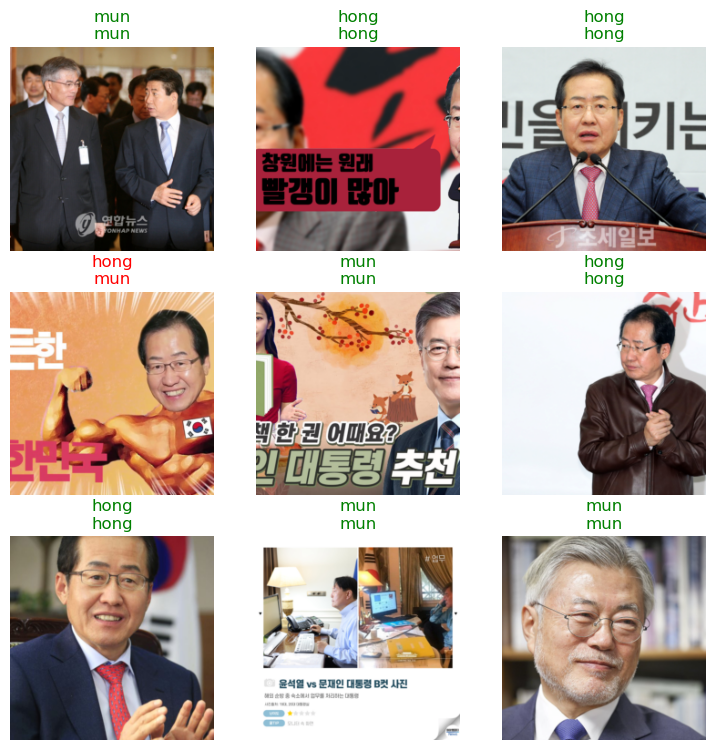

In [37]:
## step 1 : DLS
dls = ImageDataLoaders.from_folder(
    path = "./images",  ## data files directory
    train = "train",    ## train dataset directory
    valid_pct = 0.2,
    item_tfms = Resize(224)
)

## step 2 : learner
lrnr = vision_learner(
    dls = dls,
    arch = resnet34,
    metrics = accuracy
)

## step 3 : fine tunning
lrnr.fine_tune(5)

## step 4 : predict
lrnr.show_results()

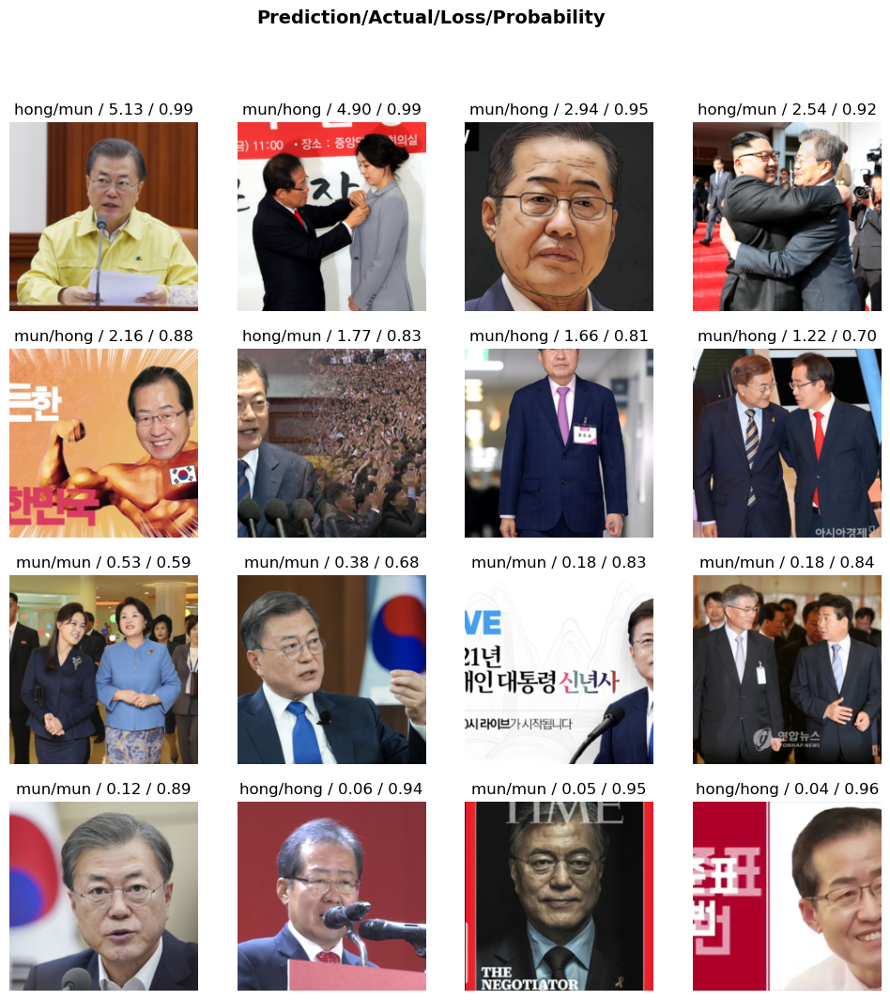

In [38]:
inter = Interpretation.from_learner(lrnr)
inter.plot_top_losses(16)

<span style="color:grey">~~이건 논란이 될 수도 있겠는데요...~~</span>